In [2]:
import numpy as np
import matplotlib.pyplot as plt
from DasTools import DasPrep as dp

In [8]:
# fiber info

fiber_cum_len = np.array([0, 1801, 5118, 8437, 10966, 13495, 16473, 19451])
fiber_lengths = np.diff(fiber_cum_len)
print(fiber_lengths)

[1801 3317 3319 2529 2529 2978 2978]


### Read metadata from the data file

In [3]:
import glob
daslist = glob.glob('H:\\FUTIAN\\Futian_20km_20230921\\*.h5')
daslist.sort()

In [4]:
daslist

['H:\\FUTIAN\\Futian_20km_20230921\\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_060333.923.h5',
 'H:\\FUTIAN\\Futian_20km_20230921\\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_060433.923.h5',
 'H:\\FUTIAN\\Futian_20km_20230921\\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_060533.923.h5',
 'H:\\FUTIAN\\Futian_20km_20230921\\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_060633.923.h5',
 'H:\\FUTIAN\\Futian_20km_20230921\\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_060733.923.h5',
 'H:\\FUTIAN\\Futian_20km_20230921\\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_060833.923.h5',
 'H:\\FUTIAN\\Futian_20km_20230921\\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_060933.923.h5',
 'H:\\FUTIAN\\Futian_20km_20230921\\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_061033.923.h5',
 'H:\\FUTIAN\\Futian_20km_20230921\\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_061133.923.h5',
 'H:\\FUTIAN\\Futian_20km_20230921\\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_061233.923.h5',


In [5]:
len(daslist)

178

In [7]:
%%time

import os
from scipy import signal

M = np.array([10, 5, 5])

savedir = '.\\futian_20km_2023_0921_deci_4Hz\\' 
if not os.path.exists(savedir):
    os.mkdir(savedir)

for ind in range(1, len(daslist)-1):
    datalen = np.array([dp.read_das(daslist[i],metadata=True)['nt'] for i in np.arange((ind-1),(ind+2))])
    Mlen = datalen // np.prod(M)
    
    data = np.concatenate([dp.read_das(daslist[i]) for i in np.arange((ind-1),(ind+2))], axis=-1)
    for iM in M:
        data = signal.decimate(data, iM, axis=-1).astype('float32')

    savename = savedir + os.path.basename(daslist[ind])[:-3] + '_4Hz.npy'
    print(savename)
    np.save(savename, data[:,(Mlen[0]):(Mlen[0]+Mlen[1])])

.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_060433.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_060533.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_060633.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_060733.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_060833.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_060933.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_061033.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_061133.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_061233.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_061333.923_4Hz.npy


.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_072633.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_072733.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_072833.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_072933.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_073033.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_073133.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_073233.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_073333.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_073433.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_073533.923_4Hz.npy


.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_084833.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_084933.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_085033.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_085133.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_085233.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_085333.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_085433.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_085533.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_085633.923_4Hz.npy
.\futian_20km_2023_0921_deci_4Hz\futian20km_GL_10m_frq_1000Hz_sp_2m_UTC_20230921_085733.923_4Hz.npy


In [10]:
data = np.load(savename)

In [11]:
data.shape

(10304, 240)

### Preview the raw data

<IPython.core.display.Javascript object>


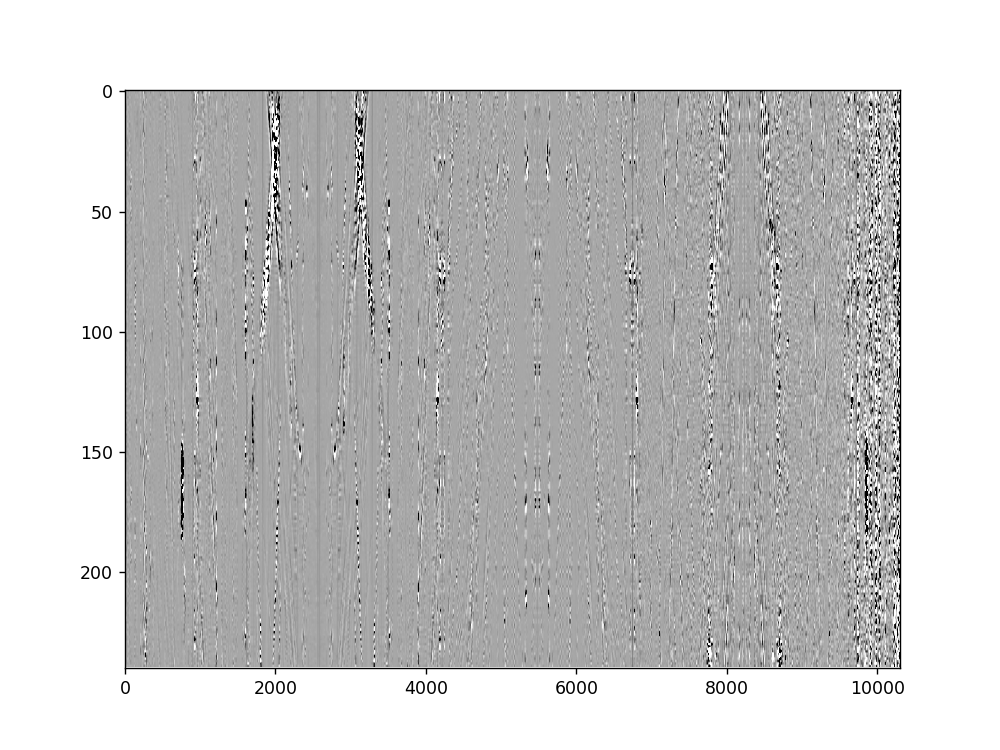

In [12]:
%matplotlib notebook
plt.figure(figsize=[8,6])

data_plot = data[:, :]
clim = data_plot.std() 
plt.imshow(data_plot.T, aspect='auto', cmap='Greys', vmin=-clim, vmax=clim)

In [15]:
npylist = glob.glob('.\\futian_20km_2023_0921_deci_4Hz\\*.npy')
npylist.sort()

In [146]:
data = np.concatenate([np.load(npylist[i]) for i in range(40,60)], axis=-1)
data.shape

data = dp.das_preprocess(data)

dt = 1./1000
Mdt = dt*np.prod(M)
data = dp.bandpass(data, Mdt, fl=0.1, fh=0.8)

In [147]:
dx = 2

<IPython.core.display.Javascript object>


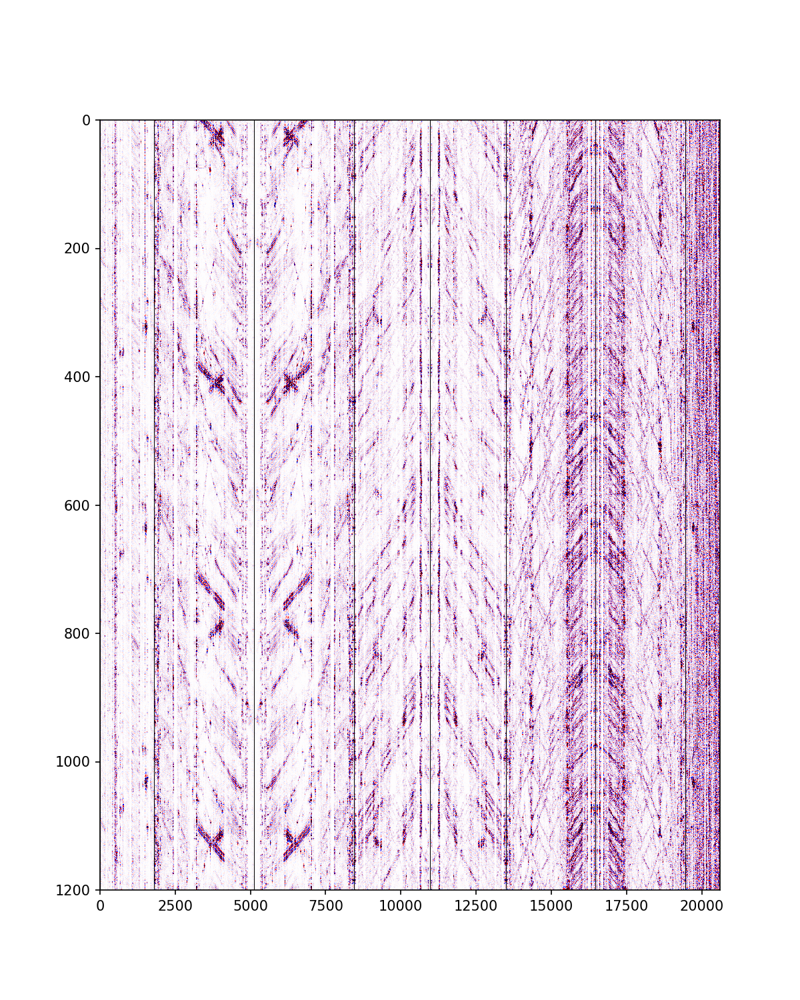

(0.0, 20608.0)

In [148]:
%matplotlib notebook
plt.figure(figsize=[8,10])

data_plot = data[:, :]/5
clim = data_plot.std() 

plot_ext = [0, data_plot.shape[0]*dx, data_plot.shape[1]*Mdt, 0]
plt.imshow(data_plot.T, aspect='auto', cmap='seismic', vmin=-clim, vmax=clim, extent = plot_ext)

for i in fiber_cum_len:
    plt.axvline(i, color='k', linewidth=0.5)
    
plt.xlim([plot_ext[0], plot_ext[1]])

In [149]:
dataEW = data[int(fiber_cum_len[2]/dx):int(fiber_cum_len[4]/dx), :]
dataSN = np.concatenate([data[:int(fiber_cum_len[1]/dx), :], data[int(fiber_cum_len[5]/dx):int(fiber_cum_len[6]/dx), :]], axis=0)

dataEW.shape, dataSN.shape

((2924, 4800), (2389, 4800))

<IPython.core.display.Javascript object>


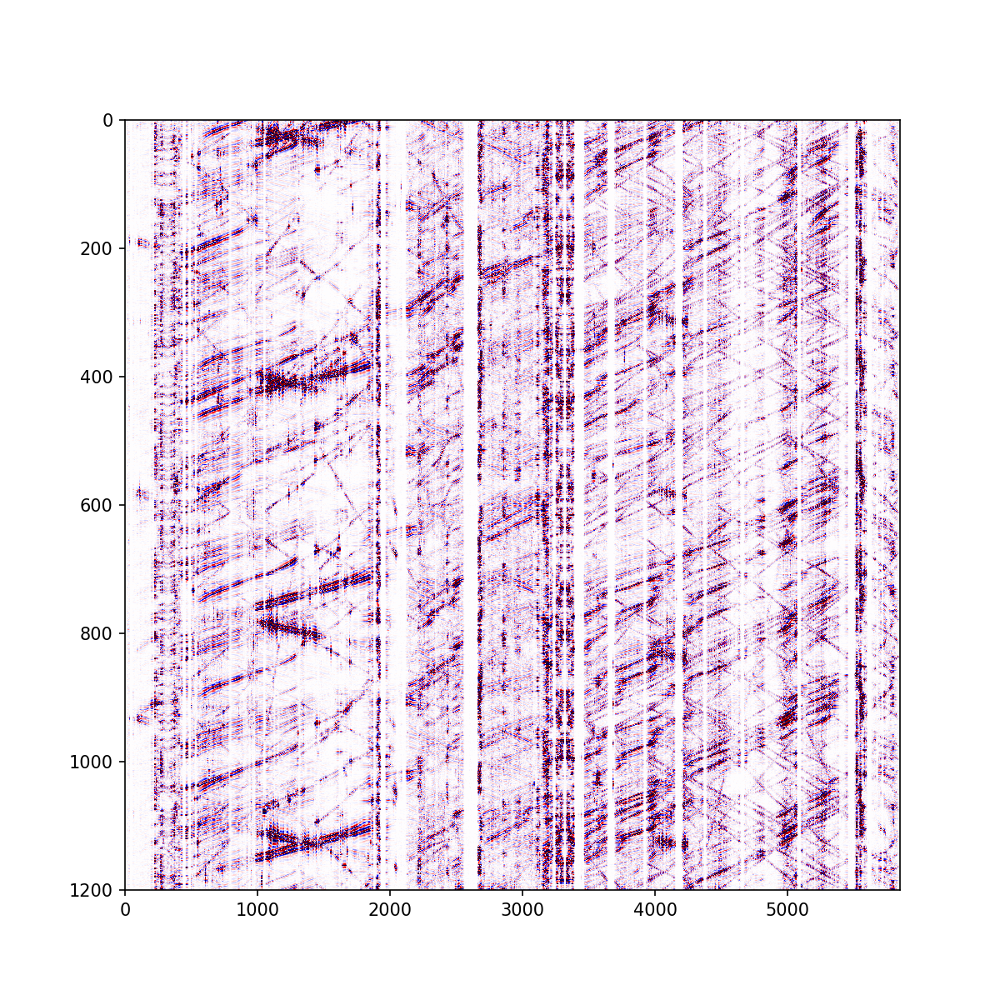

In [150]:
%matplotlib notebook
plt.figure(figsize=[8,8])

data_plot = dataEW/5
clim = data_plot.std() 

plot_ext = [0, data_plot.shape[0]*dx, data_plot.shape[1]*Mdt, 0]
plt.imshow(data_plot.T, aspect='auto', cmap='seismic', vmin=-clim, vmax=clim, extent = plot_ext)

In [151]:
EW_spool_ends = np.array([(435,457), (480,503), (1046,1058), (1929, 1967),  (2092,2118), (2556,2662),
                          (3230,3250), (3390, 3465),(3638, 3698), (3916,3940), 
                          (4152, 4212), (4364, 4394), (4647, 4670),
                          (5070,5100), (5454,5514),(5601, 5634), (5708, 5724)])

dataEW_spool_rm = np.copy(dataEW)
EWchn_spool = np.concatenate([np.arange(int(xspool[0]/dx),int(xspool[1]/dx)) for xspool in EW_spool_ends])
dataEW_spool_rm = np.delete(dataEW_spool_rm, EWchn_spool, axis=0)

<IPython.core.display.Javascript object>


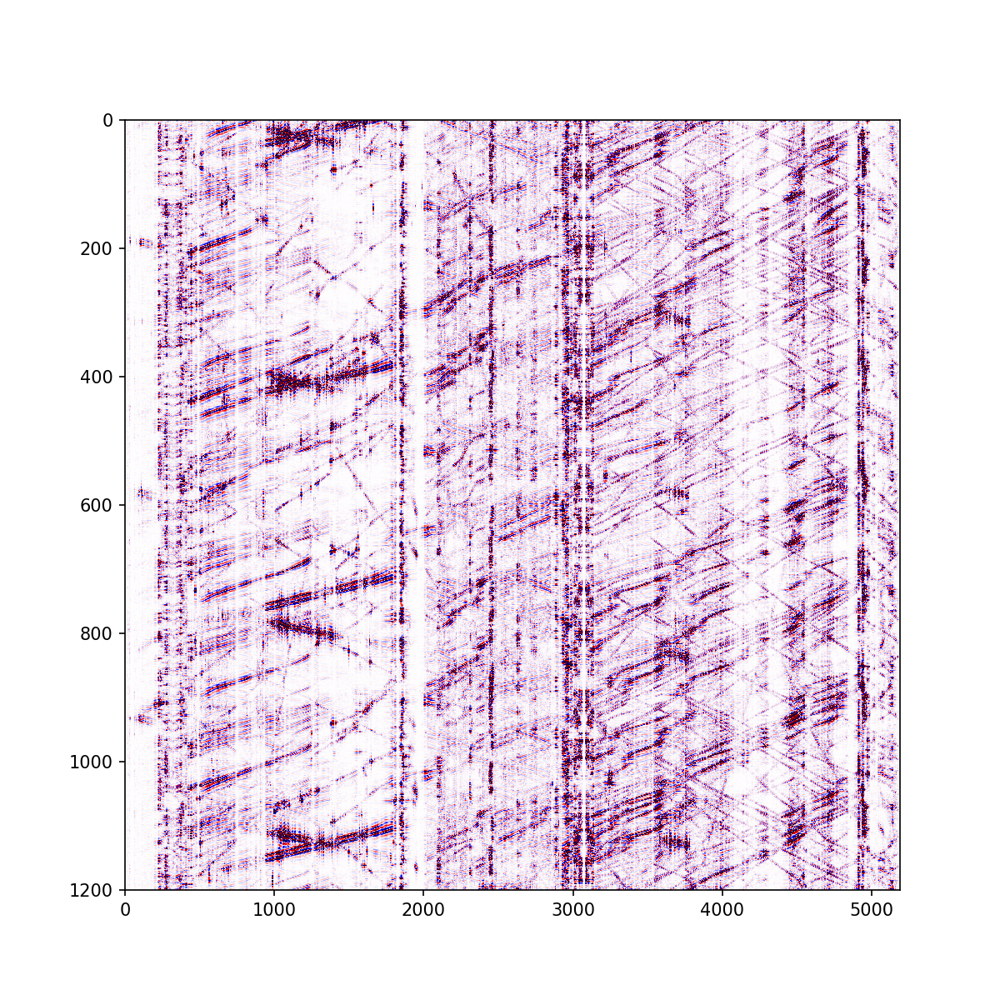

In [152]:
%matplotlib notebook
plt.figure(figsize=[8,8])

data_plot = dataEW_spool_rm/5
clim = data_plot.std() 

plot_ext = [0, data_plot.shape[0]*dx, data_plot.shape[1]*Mdt, 0]
plt.imshow(data_plot.T, aspect='auto', cmap='seismic', vmin=-clim, vmax=clim, extent = plot_ext)

<IPython.core.display.Javascript object>


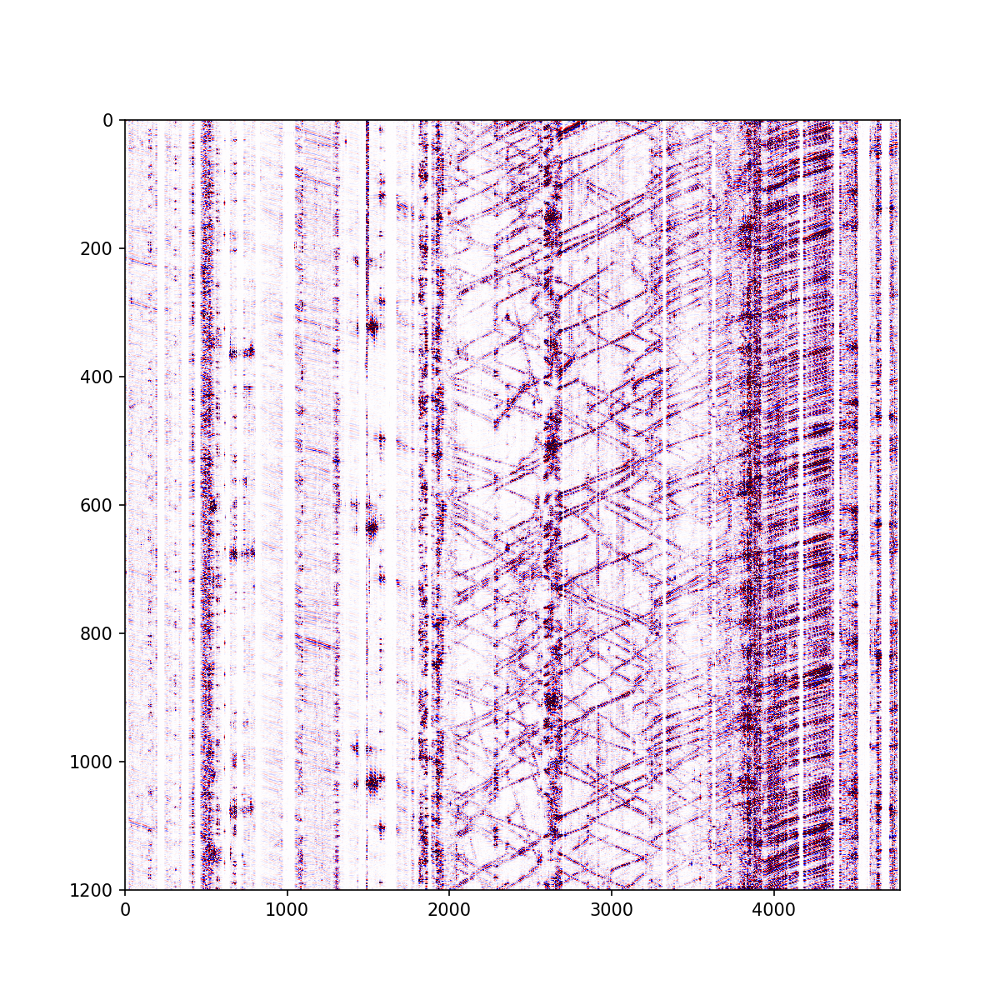

In [153]:
%matplotlib notebook
plt.figure(figsize=[8,8])

data_plot = dataSN/5
clim = data_plot.std() 

plot_ext = [0, data_plot.shape[0]*dx, data_plot.shape[1]*Mdt, 0]
plt.imshow(data_plot.T, aspect='auto', cmap='seismic', vmin=-clim, vmax=clim, extent = plot_ext)

In [154]:
spool_ends = np.array([(200, 243), (350, 390), (430,460), (590,646), (690,712), (808,832), (974,1048), 
                       (1444,1486),(1610,1672), (3016, 3030), (3316, 3336), (3618, 3640), 
                       (4146, 4184), (4368,4410),(4517,4591),(4660, 4711)])

dataSN_spool_rm = np.copy(dataSN)

chn_spool = np.concatenate([np.arange(int(xspool[0]/dx),int(xspool[1]/dx)) for xspool in spool_ends])

dataSN_spool_rm = np.delete(dataSN_spool_rm, chn_spool, axis=0)

<IPython.core.display.Javascript object>


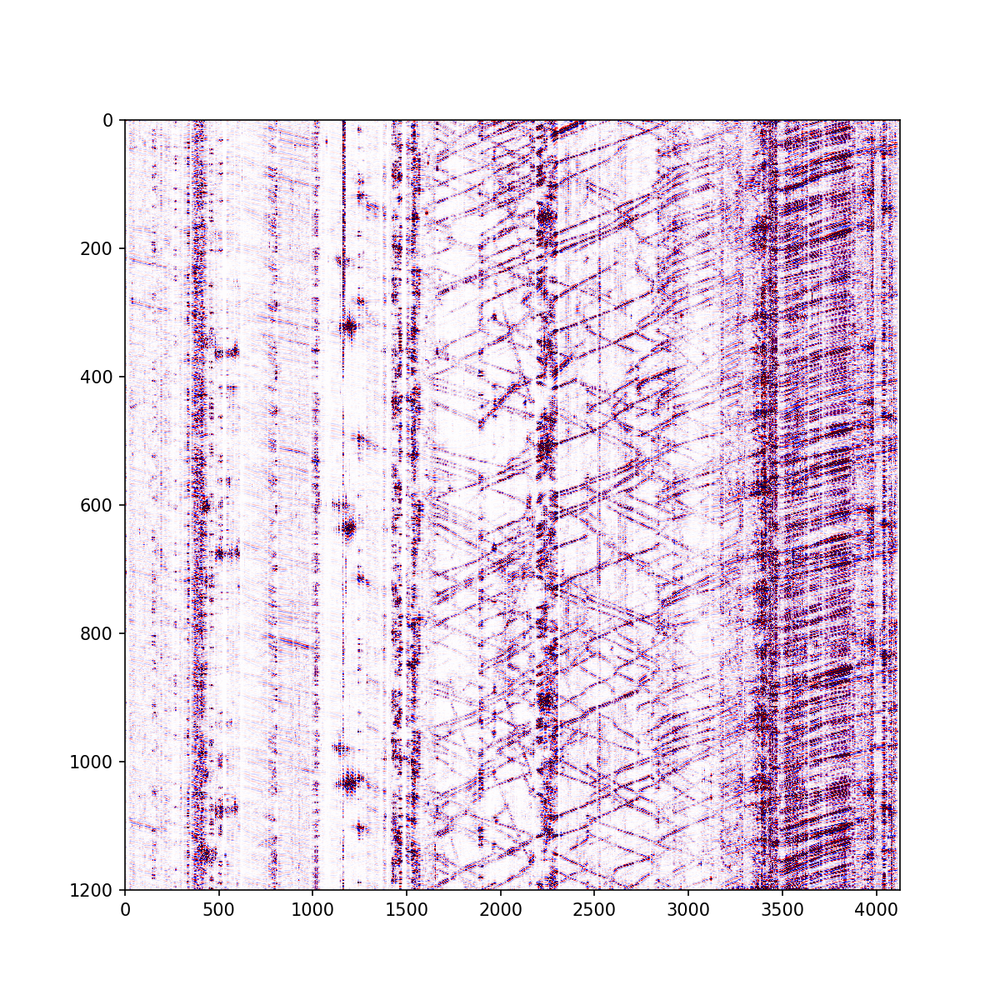

In [167]:
%matplotlib notebook
plt.figure(figsize=[8,8])

data_plot = dataSN_spool_rm / 5
clim = data_plot.std() 

plot_ext = [0, data_plot.shape[0]*dx, data_plot.shape[1]*Mdt, 0]
plt.imshow(data_plot.T, aspect='auto', cmap='seismic', vmin=-clim, vmax=clim, extent = plot_ext)

<IPython.core.display.Javascript object>


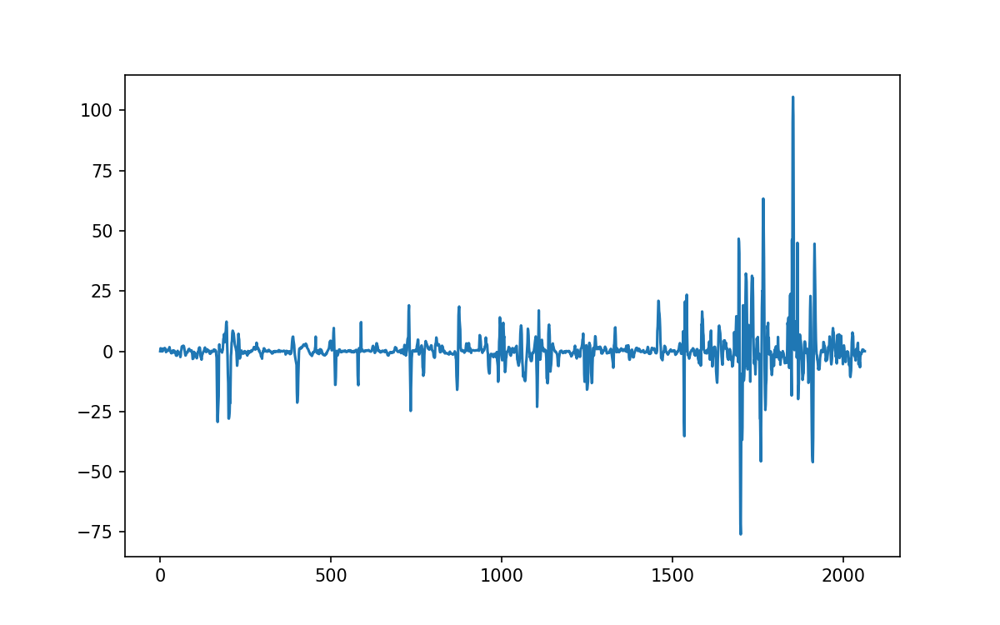

In [156]:
plt.figure(figsize=[8,5])

# plt.plot(dataSN_spool_rm[1989//2,:])

plt.plot(dataSN_spool_rm[:,int(700/Mdt)])

In [157]:
fk = np.fft.fftshift(np.fft.fft2(dataEW_spool_rm))
faxis = np.fft.fftshift(np.fft.fftfreq(dataEW_spool_rm.shape[1], Mdt))
kaxis = np.fft.fftshift(np.fft.fftfreq(dataEW_spool_rm.shape[0], dx))

In [158]:
from scipy import signal, interpolate

def sector_cut(V, Vmin, Vmax, alpha):
    
    winlen = Vmax-Vmin
    Vmin -= winlen/(1-alpha)*alpha/2
    Vmax += winlen/(1-alpha)*alpha/2

    x = np.linspace(Vmin, Vmax, 5000)
    y = signal.tukey(len(x),alpha)

    return np.interp(V, x, y)


FF, KK = np.meshgrid(faxis, kaxis)
VV = FF / (KK+1e-20)
Vtheta = np.arctan(abs(VV))

Vmin, Vmax, alpha = np.arctan(20/3.6), np.arctan(80/3.6), 0.5

VV_mask = sector_cut(Vtheta, Vmin, Vmax, alpha)

<IPython.core.display.Javascript object>


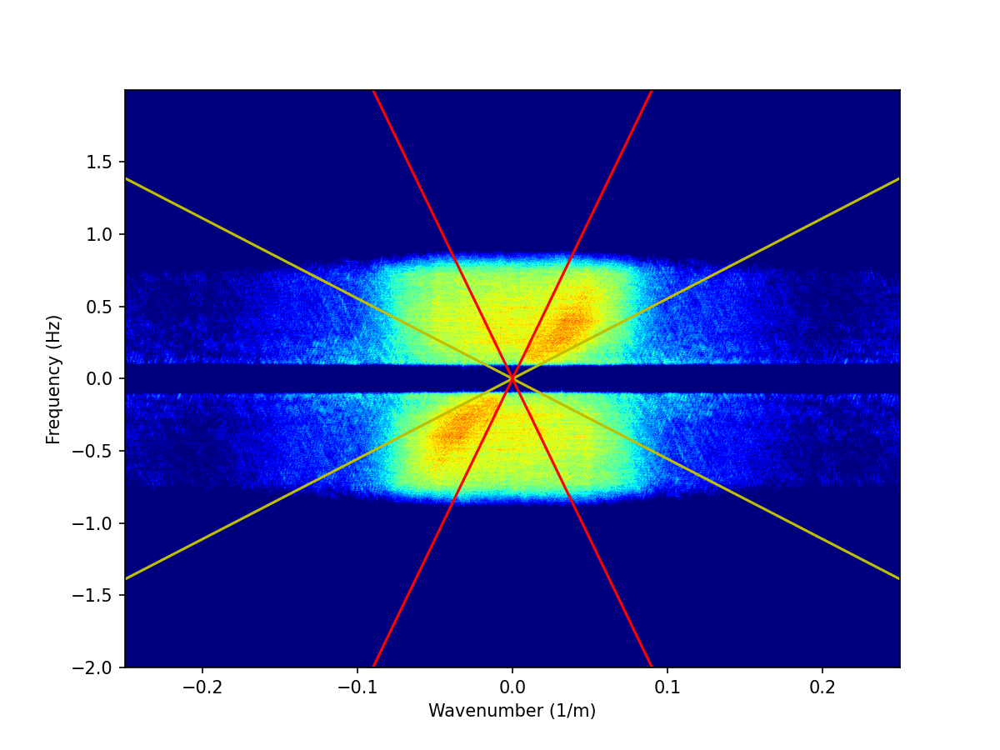

(-2.0, 1.9991666666666668)

In [159]:
plt.figure(figsize=[8,6])

data_plot = abs(fk[:, :])
clim = data_plot.std() 
extent = [kaxis[0], kaxis[-1], faxis[0], faxis[-1]]
plt.imshow(np.log10(data_plot).T, aspect='auto', cmap='jet', vmin=4, vmax=5.5, 
           origin='lower', extent=extent)

plt.plot(kaxis, kaxis * 20/3.6,'y')
plt.plot(kaxis, kaxis * -20/3.6,'y')

plt.plot(kaxis, kaxis * 80/3.6,'r')
plt.plot(kaxis, kaxis * -80/3.6,'r')


plt.xlabel('Wavenumber (1/m)')
plt.ylabel('Frequency (Hz)')

plt.ylim([faxis.min(),faxis.max()])

<IPython.core.display.Javascript object>


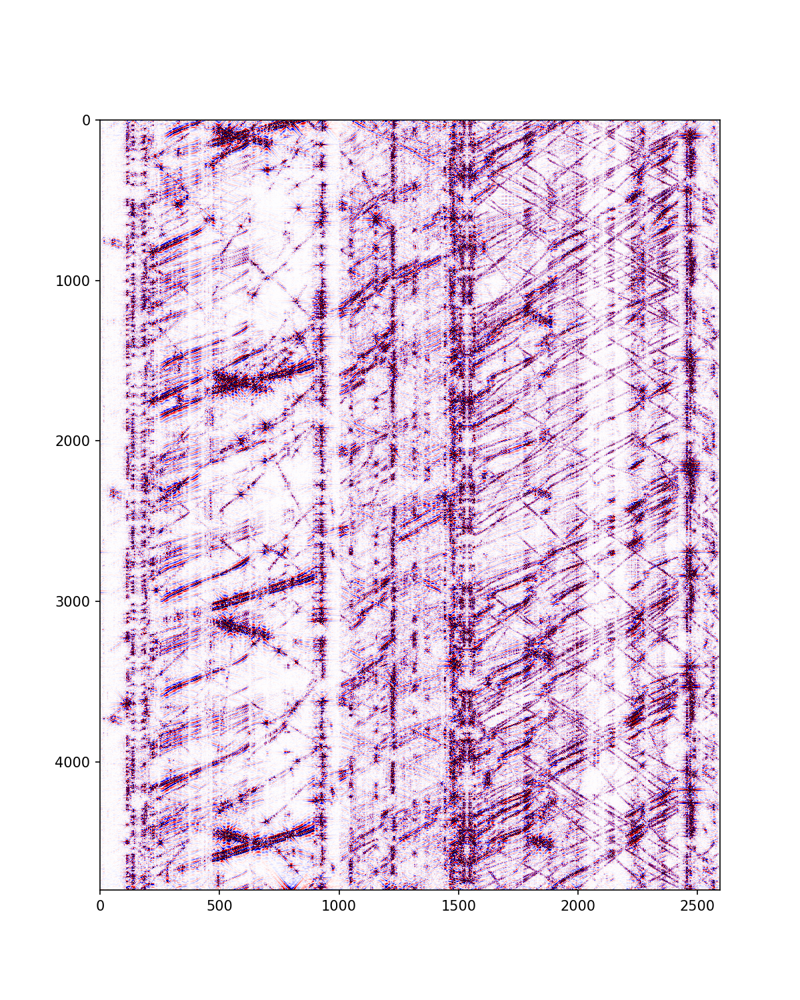

In [166]:
%matplotlib notebook
plt.figure(figsize=[8,10])

data_plot = np.fft.ifft2(np.fft.ifftshift(VV_mask * fk)).real 
clim = data_plot.std() 
plt.imshow(data_plot.T, aspect='auto', cmap='seismic', vmin=-clim, vmax=clim)

In [164]:
def fk_transform(data2D, dt, dx):
    fk = np.fft.fftshift(np.fft.fft2(data2D))
    faxis = np.fft.fftshift(np.fft.fftfreq(data2D.shape[1], dt))
    kaxis = np.fft.fftshift(np.fft.fftfreq(data2D.shape[0], dx))
    return fk, faxis, kaxis

fk_sub, faxis_sub, kaxis_sub = fk_transform(dataEW[1600:2500, 0:1000], Mdt, dx)

<IPython.core.display.Javascript object>


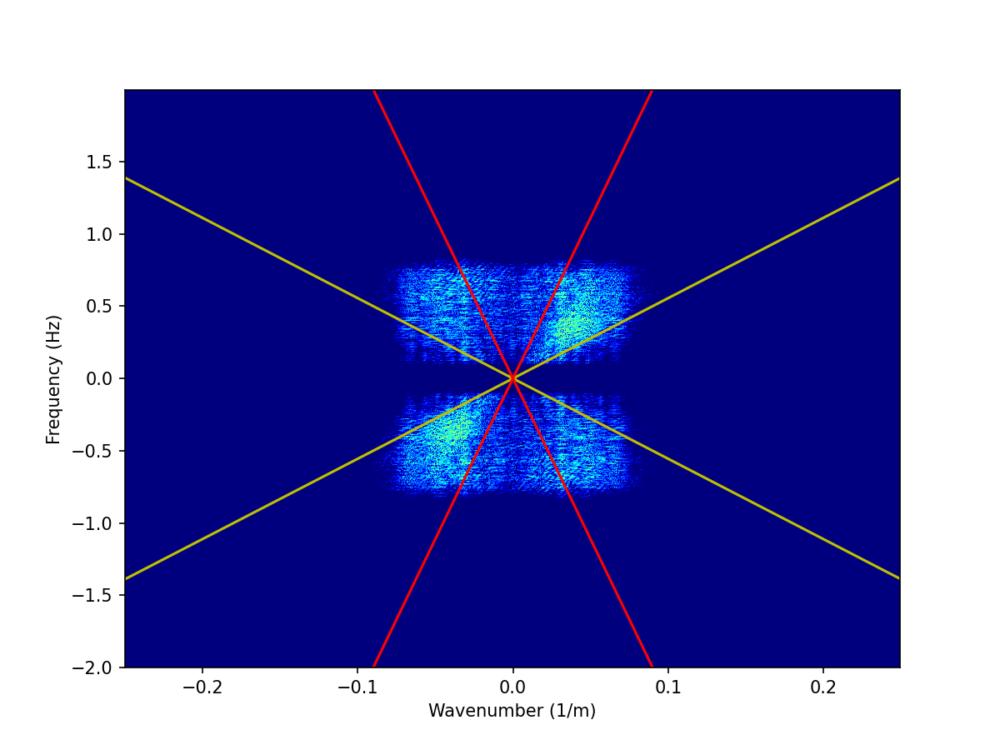

(-2.0, 1.996)

In [165]:
plt.figure(figsize=[8,6])

data_plot = abs(fk_sub[:, :])
clim = data_plot.std() 
extent = [kaxis_sub[0], kaxis_sub[-1], faxis_sub[0], faxis_sub[-1]]
plt.imshow(np.log10(data_plot).T, aspect='auto', cmap='jet', vmin=4, vmax=5.5, 
           origin='lower', extent=extent)

plt.plot(kaxis_sub, kaxis_sub * 20/3.6,'y')
plt.plot(kaxis_sub, kaxis_sub * -20/3.6,'y')

plt.plot(kaxis_sub, kaxis_sub * 80/3.6,'r')
plt.plot(kaxis_sub, kaxis_sub * -80/3.6,'r')


plt.xlabel('Wavenumber (1/m)')
plt.ylabel('Frequency (Hz)')

plt.ylim([faxis_sub.min(),faxis_sub.max()])